In [1]:
####### Import all necessary functions 
import os
import glob
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt 
import h5py

In [2]:
paperfolder = '\\OneDrive - Northwestern University\\Documents - Backman Lab - Shared Folders\\Lab Paper Drafts'
parentfolder = glob.glob('C:\\Users\\**'+paperfolder)[0]+'\\FISH vs. CRISPR'
savefolder = '\\PLOS ONE Revision Files\\PLOS ONE Revision Experiments\\PWS Images'

In [3]:
mpl.rcParams["figure.dpi"] = 600
mpl.rcParams["axes.edgecolor"] = 'k'
mpl.rcParams['text.color'] = 'k'
mpl.rcParams['axes.labelcolor'] = 'k'
mpl.rcParams['xtick.color'] = 'k'
mpl.rcParams['ytick.color'] = 'k'
mpl.rcParams['font.weight'] = 'bold'
mpl.rcParams["axes.labelweight"] = "bold"
mpl.rcParams["axes.titleweight"] = "bold"
mpl.rcParams['errorbar.capsize'] = 2.5
mpl.rcParams['legend.frameon'] = False

# Define a custom colormap that ranges from black to red
cmap_colors = [(0, 0, 0), (0.5, 0, 0)]
cmap = mpl.colors.LinearSegmentedColormap.from_list('my_colormap', cmap_colors, N=256)

# Define a custom colormap that ranges from black to gray
graycmap = mpl.colormaps.get_cmap('gray')
newgray = mpl.colors.ListedColormap(graycmap(np.linspace(0, 0.25, 256)))

minv = 1.5
maxv = 3

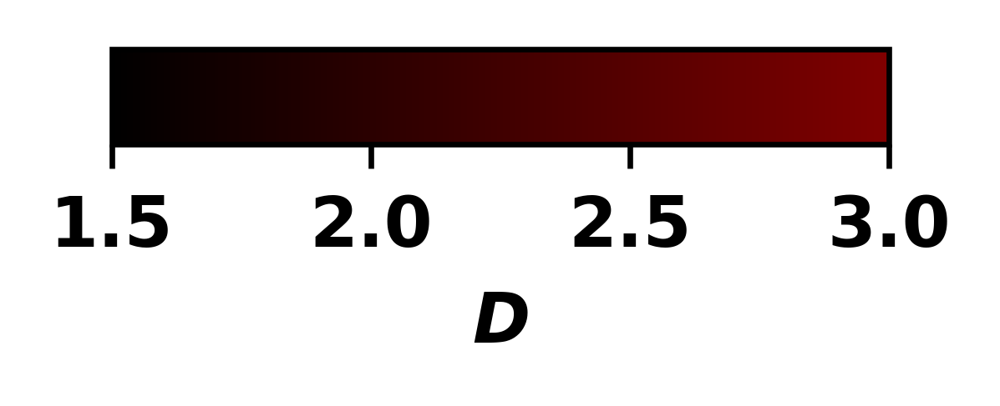

In [4]:
fig, ax = plt.subplots(figsize=(2, 0.5))
fig.subplots_adjust(bottom=0.5)

norm = mpl.colors.Normalize(vmin=minv, vmax=maxv)

cb = mpl.colorbar.ColorbarBase(ax,cmap=cmap,norm=norm,orientation='horizontal')
cb.ax.set_xlabel(r'$D$')
plt.savefig(parentfolder+savefolder+'\\PWS D Colorbar Horizontal.pdf',dpi=600,transparent=True,bbox_inches='tight')
plt.show()

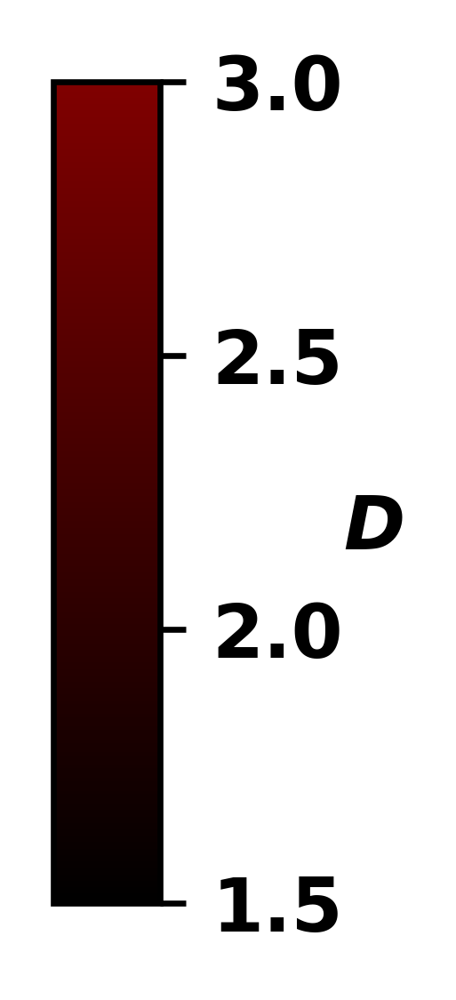

In [5]:
fig, ax = plt.subplots(figsize=(0.5, 2))
fig.subplots_adjust(left=0.5)

norm = mpl.colors.Normalize(vmin=minv, vmax=maxv)

cb = mpl.colorbar.ColorbarBase(ax,cmap=cmap,norm=norm,orientation='vertical')
cb.ax.set_ylabel(r'$D$',rotation=0)
plt.savefig(parentfolder+savefolder+'\\PWS D Colorbar Vertical.pdf',dpi=600,transparent=True,bbox_inches='tight')
plt.show()

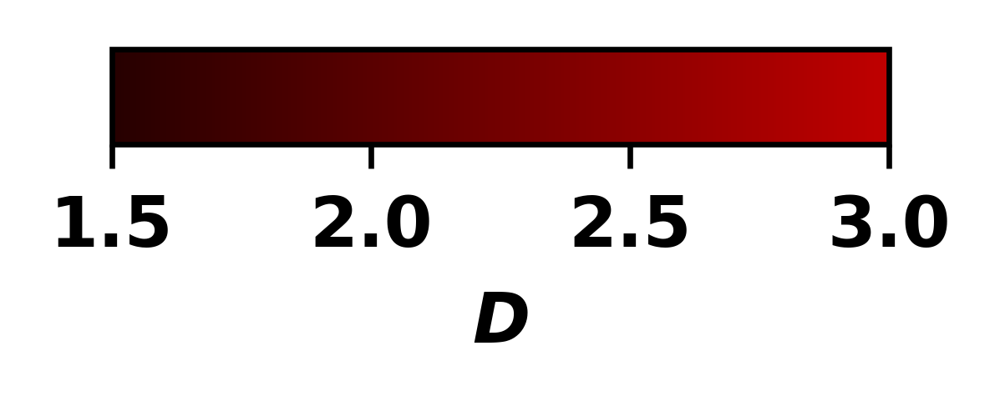

In [6]:
fig, ax = plt.subplots(figsize=(2, 0.5))
fig.subplots_adjust(bottom=0.5)

# Define a custom colormap that ranges from black to red
cmap_colors = [(0.15, 0, 0), (0.75, 0, 0)]
cmap = mpl.colors.LinearSegmentedColormap.from_list('my_colormap', cmap_colors, N=256)
norm = mpl.colors.Normalize(vmin=minv, vmax=maxv)

cb = mpl.colorbar.ColorbarBase(ax,cmap=cmap,norm=norm,orientation='horizontal')
cb.ax.set_xlabel(r'$D$')
plt.savefig(parentfolder+savefolder+'\\PWS D Colorbar Horizontal Anne.pdf',dpi=600,transparent=True,bbox_inches='tight')
plt.show()

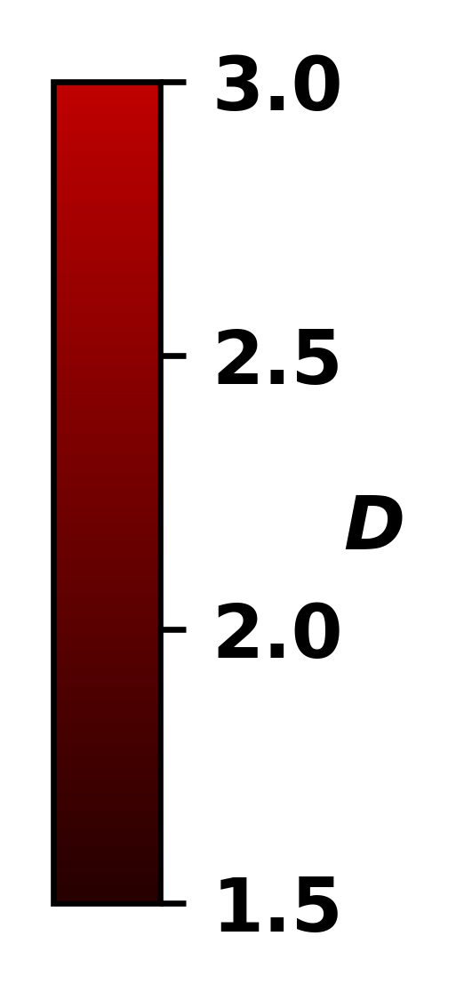

In [7]:
fig, ax = plt.subplots(figsize=(0.5, 2))
fig.subplots_adjust(left=0.5)

# Define a custom colormap that ranges from black to red
cmap_colors = [(0.15, 0, 0), (0.75, 0, 0)]
cmap = mpl.colors.LinearSegmentedColormap.from_list('my_colormap', cmap_colors, N=256)
norm = mpl.colors.Normalize(vmin=minv, vmax=maxv)

cb = mpl.colorbar.ColorbarBase(ax,cmap=cmap,norm=norm,orientation='vertical')
cb.ax.set_ylabel(r'$D$',rotation=0)
plt.savefig(parentfolder+savefolder+'\\PWS D Colorbar Vertical Anne.pdf',dpi=600,transparent=True,bbox_inches='tight')
plt.show()

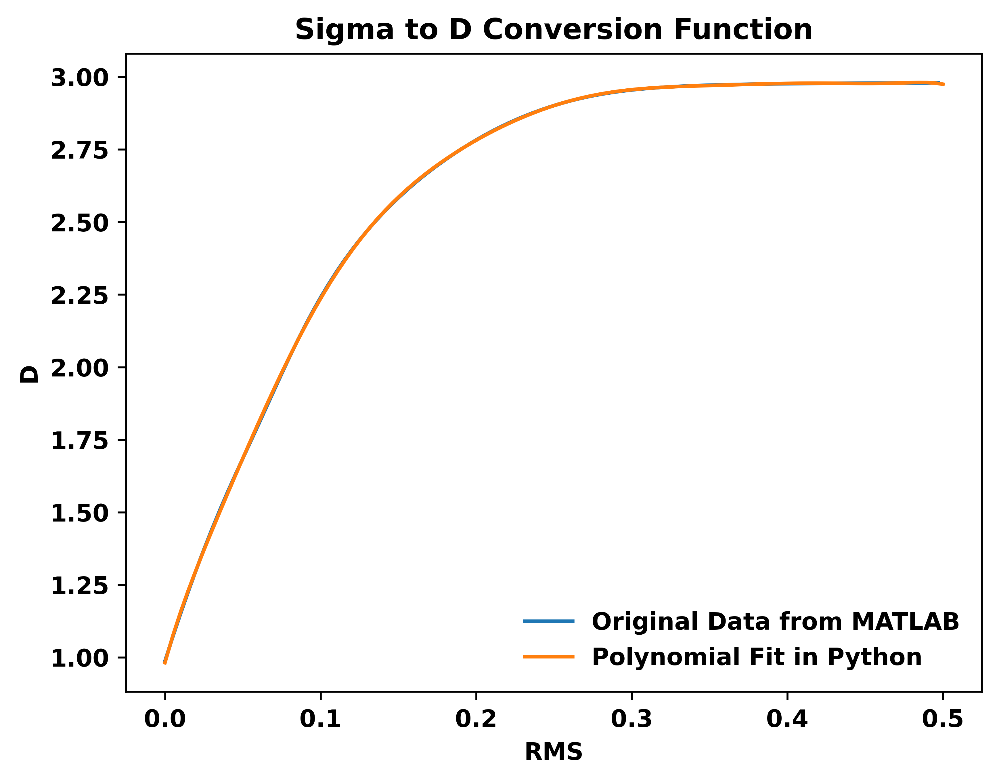

In [6]:
convlut = pd.read_csv(parentfolder+'\\PLOS ONE Revision Files\\Scripts\\Sigma to D\\SigmaToDLUT_LCPWS2.csv')
convfunc = np.poly1d(np.polyfit(convlut.RMS,convlut.D,10))

plt.plot(convlut.RMS,convlut.D,label='Original Data from MATLAB')
plotx = np.linspace(0,0.5,100)
plt.plot(plotx,convfunc(plotx),label='Polynomial Fit in Python')
plt.title('Sigma to D Conversion Function')
plt.xlabel('RMS')
plt.ylabel('D')
plt.legend()
plt.show()

In [8]:
imfolders = ['\\PLOS ONE Revision Files\\PLOS ONE Revision Experiments\\CRISPR PWS',
             '\\PLOS ONE Revision Files\\PLOS ONE Revision Experiments\\FISH PWS',
             '\\PLOS ONE Revision Files\\PLOS ONE Revision Experiments\\Fixation PWS',
             '\\PLOS ONE Revision Files\\PLOS ONE Revision Experiments\\Optimization PWS',
             '\\PLOS ONE Manuscript Files\\iScience Revision Experiments\\Optimization PWS Old',
             '\\PLOS ONE Manuscript Files\\iScience Revision Experiments\\CRISPR PWS',
             '\\PLOS ONE Revision Files\\PLOS ONE Revision Experiments\\RASER-FISH PWS']

for fold in imfolders:
    imlist = [filepath for filepath in glob.glob(parentfolder+fold+'/**/analysisResults_p0.h5', recursive=True)]
    for file in imlist:
#     for file in [imlist[0],imlist[55]]:
        expfolder = str.split(fold,'\\')[-1]
        subfolderpath = file[file.index(fold)+len(fold)+1:]
        fullsplitpath = str.split(subfolderpath,'\\')
        subsplitpath = [folder for folder in fullsplitpath if not (folder=='PWS') and not (folder=='analyses') and 
                        not (folder=='analysisResults_p0.h5')]

        savesubfold = str.split(fold,'\\')[-1]+'\\'+('\\').join(subsplitpath[0:-1])
        fullsavepath = parentfolder+savefolder+'\\'+savesubfold
        if not os.path.exists(fullsavepath):
            os.makedirs(fullsavepath)
        cellfolder = '\\'+('\\').join(subsplitpath)

        # try:
        rmsfile = h5py.File(file, 'r')
        rmsim = rmsfile['rms'][()]
        rmsfile.close()
        rmsim[rmsim>0.5] = 0.5
        Dim = convfunc(rmsim)

        roipath = parentfolder+fold+cellfolder+'\\ROI_nuc.h5'
        if os.path.exists(roipath):
            roifile = h5py.File(roipath, 'r')
            allrois = np.empty(Dim.shape)
            allroiD = pd.DataFrame()
            # allroihist = pd.DataFrame()
            for key in roifile.keys():
                roimask = roifile[key+'/mask'][()]
                roimask[(roimask<1.5)&(~roimask==0)] = 1.5
                roimask[roimask>3] = 3
                roiDpixels = Dim[np.where(roimask == 1)]
                allroiD = pd.concat([allroiD,pd.Series(roiDpixels,name='Nuc'+key)],axis=1)
                # roihist = np.histogram(roiDpixels,bins=25,range=(1.5,3))
                # allroihist = pd.concat([allroihist,pd.Series(roihist[0],name='Nuc'+key)],axis=1)
                allrois = allrois + roimask
            roifile.close()
            allrois = allrois.astype(bool)
            allroiD.to_csv(fullsavepath+'\\'+subsplitpath[-1]+'_D_Pixels.csv',index=False)
            # allroihist.insert(0,'Left Bin Edge',pd.Series(roihist[1]))
            # allroihist.insert(1,'Right Bin Edge',pd.Series(roihist[1][1:]))
            # allroihist.to_csv(fullsavepath+'\\'+subsplitpath[-1]+'_Histogram.csv',index=False)

            maskedim = np.ma.array(Dim, mask=~allrois)

            fig, ax = plt.subplots()
            ax.imshow(Dim, cmap=newgray, vmin=minv, vmax=maxv)
            ax.imshow(maskedim, cmap=cmap, vmin=minv, vmax=maxv)
            plt.axis('off')
            plt.savefig(fullsavepath+'\\'+subsplitpath[-1]+'_PWS.tif',transparent=True,bbox_inches='tight',pad_inches=0)
            plt.close(fig)
        # except:
        #     print('Error opening file: '+cellfolder)

        bfim = plt.imread(parentfolder+fold+cellfolder+'\\PWS\\image_bd.tif')
        fig, ax = plt.subplots()
        ax.imshow(bfim,cmap='gray')
        plt.axis('off')
        plt.savefig(fullsavepath+'\\'+subsplitpath[-1]+'_BF.tif',transparent=True,bbox_inches='tight',pad_inches=0)
        plt.close(fig)

In [ ]:
# ######## TEST CODE FOR ONE CELL

# imfolders = [
#     '\\PLOS ONE Revision Files\\PLOS ONE Revision Experiments\\Fixation PWS',
#     # '\\PLOS ONE Manuscript Files\\iScience Revision Experiments\\FISH PWS',
#     # '\\PLOS ONE Manuscript Files\\iScience Revision Experiments\\CRISPR PWS',
#     # '\\PLOS ONE Revision Files\\PLOS ONE Revision Experiments\\RASER-FISH PWS'
# ]

# for fold in imfolders:
#     imlist = [filepath for filepath in glob.glob(parentfolder+fold+'/**/analysisResults_p0.h5', recursive=True)]
#     # for file in imlist:
#     for file in [imlist[0],imlist[55]]:
#         expfolder = str.split(fold,'\\')[-1]
#         subfolderpath = file[file.index(fold)+len(fold)+1:]
#         fullsplitpath = str.split(subfolderpath,'\\')
#         subsplitpath = [folder for folder in fullsplitpath if not (folder=='PWS') and not (folder=='analyses') and 
#                         not (folder=='analysisResults_p0.h5')]

#         savesubfold = str.split(fold,'\\')[-1]+'\\'+('\\').join(subsplitpath[0:-1])
#         fullsavepath = parentfolder+savefolder+'\\'+savesubfold
#         if not os.path.exists(fullsavepath):
#             os.makedirs(fullsavepath)
#         cellfolder = '\\'+('\\').join(subsplitpath)

#         # try:
#         rmsfile = h5py.File(file, 'r')
#         rmsim = rmsfile['rms'][()]
#         rmsfile.close()
#         rmsim[rmsim>0.5] = 0.5
#         Dim = convfunc(rmsim)

#         roipath = parentfolder+fold+cellfolder+'\\ROI_nuc.h5'
#         if os.path.exists(roipath):
#             roifile = h5py.File(roipath, 'r')
#             allrois = np.empty(Dim.shape)
#             allroiD = pd.DataFrame()
#             allroihist = pd.DataFrame()
#             for key in roifile.keys():
#                 roimask = roifile[key+'/mask'][()]
#                 roimask[(roimask<1.5)&(~roimask==0)] = 1.5
#                 roimask[roimask>3] = 3
#                 roiDpixels = Dim[np.where(roimask == 1)]
#                 allroiD = pd.concat([allroiD,pd.Series(roiDpixels,name='Nuc'+key)],axis=1)
#                 roihist = np.histogram(roiDpixels,bins=25,range=(1.5,3))
#                 allroihist = pd.concat([allroihist,pd.Series(roihist[0],name='Nuc'+key)],axis=1)
#                 allrois = allrois + roimask
#             roifile.close()
#             allrois = allrois.astype(bool)
#             allroihist.insert(0,'Left Bin Edge',pd.Series(roihist[1]))
#             allroihist.insert(1,'Right Bin Edge',pd.Series(roihist[1][1:]))
#             # allroihist.to_csv(fullsavepath+'\\'+subsplitpath[-1]+'_Histogram.csv',index=False)

#             maskedim = np.ma.array(Dim, mask=~allrois)

#             fig, ax = plt.subplots()
#             ax.imshow(Dim, cmap=newgray, vmin=minv, vmax=maxv)
#             ax.imshow(maskedim, cmap=cmap, vmin=minv, vmax=maxv)
#             # plt.axis('off')
#             # plt.savefig(fullsavepath+'\\'+subsplitpath[-1]+'_PWS.tif',transparent=True,bbox_inches='tight',pad_inches=0)
#             # plt.close(fig)
#         # except:
#         #     print('Error opening file: '+cellfolder)

#         bfim = plt.imread(parentfolder+fold+cellfolder+'\\PWS\\image_bd.tif')
#         fig, ax = plt.subplots()
#         ax.imshow(bfim,cmap='gray')
#         # plt.axis('off')
#         # plt.savefig(fullsavepath+'\\'+subsplitpath[-1]+'_BF.tif',transparent=True,bbox_inches='tight',pad_inches=0)
#         # plt.close(fig)

In [7]:
# ###### NICK'S CODE FROM THE PWS ANALYSIS SOFTWARE

# def roiColor(data,roimask,vmin=convfunc(0.04),vmax=convfunc(0.3),scale_bg=1,hue=0,exponent=1,numScaleBarPix=0):
#     """
#     Given a 2D image of data this function will scale the data, apply an exponential curve, and color the ROI regions with Hue.
#     Used in many presentations and publications.

#     Args:
#         data (np.ndarray): an MxN array of data to be imaged
#         rois (List[Roi]): a list of Roi objects. the regions inside a roiFile will be colored.
#         vmin (float): the minimum value in the data that will be set to black
#         vmax (float): the maximum value in the data that will be set to white
#         scale_bg (float): Scales the brightness of the background (non-roiFile) region.
#         hue (float): A value of 0-1 indicating the hue of the colored regions.
#         exponent (float): The exponent used to curve the color map for more pleasing results.
#         numScaleBarPix (float): The length of the scale bar in number of pixels.

#     Returns:
#         np.ndarray: MxNx3 RGB array of the image"""

#     # scale and process rms cube (this is probably not the best way to do it)
#     data = data - vmin
#     data[data < 0] = 0
#     data[data > (vmax - vmin)] = vmax - vmin
#     data = data ** exponent
#     data = data * 1 / ((vmax - vmin) ** exponent) # normalize image so maximum value is 1

#     # make the nucs red and everything else gray scale
#     hsv = np.ones((data.shape[0], data.shape[1], 3))
#     hsv[:,:,2] = data
#     hsv[:,:,2][~roimask] *= scale_bg
#     hsv[:,:,0] = hue
#     hsv[:,:,1][~roimask] = 0
#     out = mpl.colors.hsv_to_rgb(hsv)

#     if (numScaleBarPix > 0):
#         out[round(out.shape[0]*.965):round(out.shape[0]*.975), round(out.shape[0]*.03):round(out.shape[0] * .03 + numScaleBarPix), :] = 1

#     return out

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


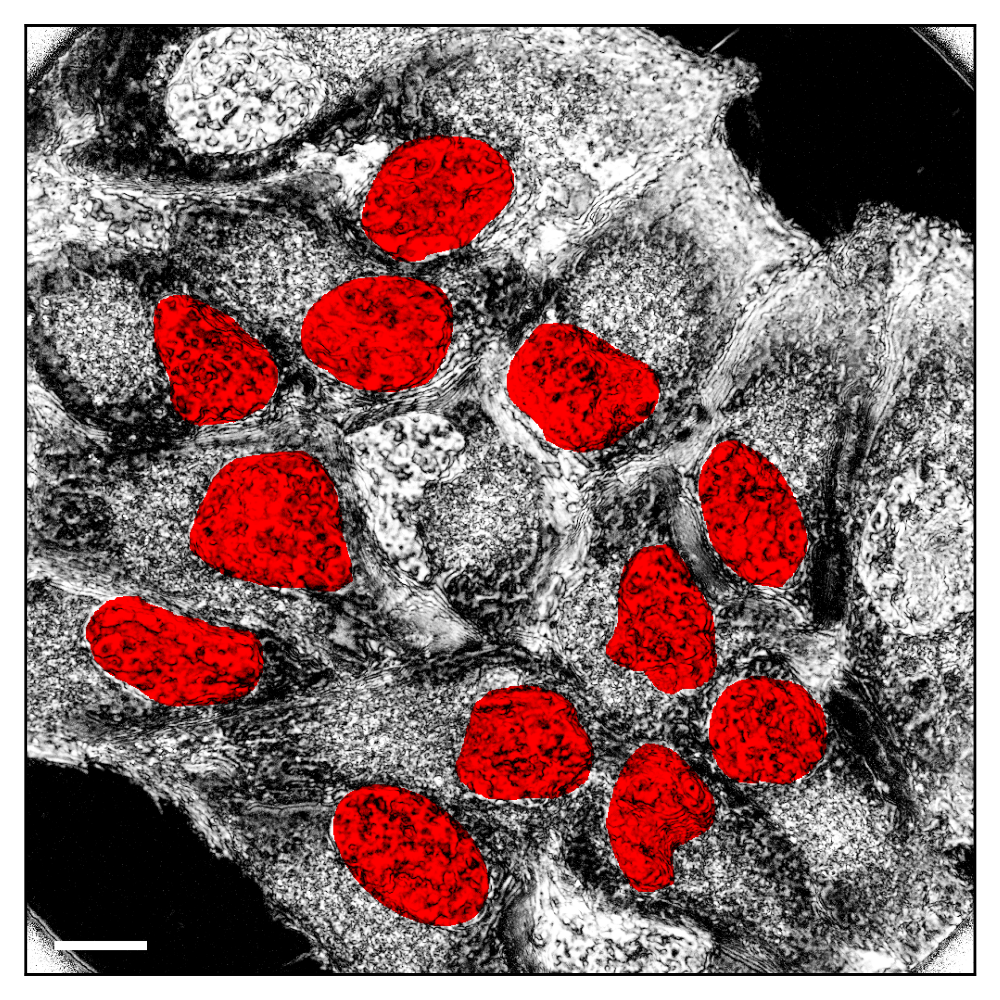

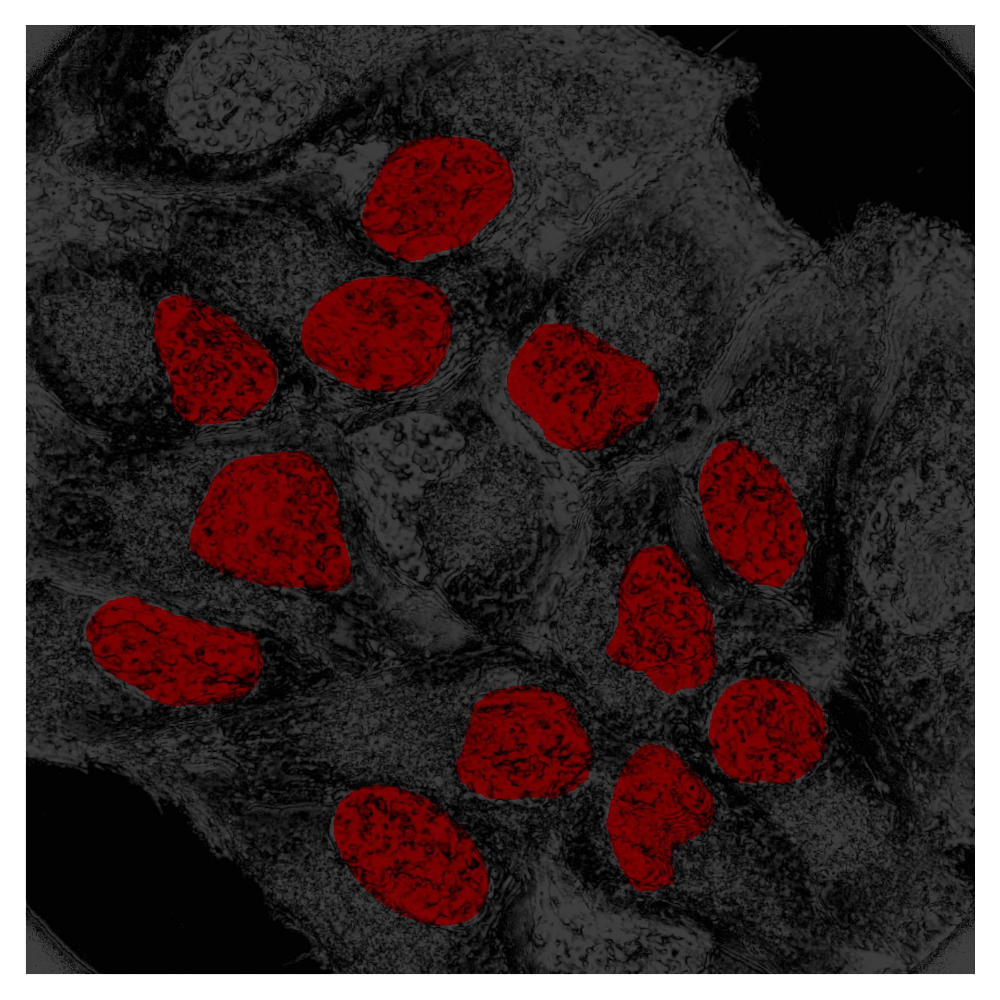

In [8]:
# ######### COMPARE TO NICK'S CODE

# file = "C:\\Users\\jfi977\\OneDrive - Northwestern University\\Documents - Backman Lab - Shared Folders\\Lab Paper Drafts\\FISH vs. CRISPR\\PLOS ONE Manuscript Files\\iScience Revision Experiments\\Optimization PWS\\10-24-2022\\Live Cell 1\\Cell3\\PWS\\analyses\\analysisResults_p0.h5"
# rmsfile = h5py.File(file, 'r')
# rmsim = rmsfile['rms'][()]
# rmsfile.close()
# rmsim[rmsim>0.5] = 0.5
# Dim = convfunc(rmsim)

# roipath = "C:\\Users\\jfi977\\OneDrive - Northwestern University\\Documents - Backman Lab - Shared Folders\\Lab Paper Drafts\\FISH vs. CRISPR\\PLOS ONE Manuscript Files\\iScience Revision Experiments\\Optimization PWS\\10-24-2022\\Live Cell 1\\Cell3\\ROI_nuc.h5"
# if os.path.exists(roipath):
#     roifile = h5py.File(roipath, 'r')
#     allrois = np.empty(Dim.shape)
#     for key in roifile.keys():
#         allrois = allrois + roifile[key+'/mask'][()]
#     roifile.close()
#     allrois = allrois.astype(bool)

# out = roiColor(Dim,allrois,exponent=1.1,numScaleBarPix=100)
# fig, ax = plt.subplots()
# ax.xaxis.set_visible(False)
# ax.yaxis.set_visible(False)
# ax.imshow(out)#, vmax=vmax, vmin=vmin)
# plt.show()

# maskedim = np.ma.array(Dim, mask=~allrois)
# fig, ax = plt.subplots()
# ax.imshow(Dim, cmap=newgray, vmin=minv, vmax=maxv)
# ax.imshow(maskedim, cmap=cmap, vmin=minv, vmax=maxv)
# plt.axis('off')
# plt.show()
# # plt.savefig(fullsavepath+'\\'+subsplitpath[-1]+'_PWS.tif',transparent=True,bbox_inches='tight')
# # plt.close(fig)